In [1]:
!nvidia-smi

Mon Dec 29 21:02:30 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 581.57                 Driver Version: 581.57         CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650      WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   58C    P0             16W /   50W |       0MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import json
import itertools
import logging
import math
import os
import random
from pathlib import Path
from typing import Any, Callable, Dict, List, Optional, Union

import accelerate
import numpy as np
import safetensors
import torch
import torch.nn.functional as F
import transformers
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import ProjectConfiguration, set_seed
from PIL import Image
from torch.utils.data import Dataset
import torchvision
import torchvision.transforms as T
from torchvision import transforms
from tqdm.auto import tqdm
from transformers import AutoTokenizer, CLIPTextModel
from safetensors.torch import load_file

import diffusers
from diffusers import StableDiffusionPipeline
from diffusers.pipelines import BlipDiffusionPipeline
from diffusers import AutoencoderKL, DDPMScheduler, UNet2DConditionModel, DiffusionPipeline
from diffusers.loaders import AttnProcsLayers
from diffusers.models.attention_processor import CustomDiffusionAttnProcessor, CustomDiffusionAttnProcessor2_0
from diffusers.optimization import get_scheduler
from diffusers.utils import load_image
from diffusers.callbacks import MultiPipelineCallbacks, PipelineCallback
from diffusers.image_processor import PipelineImageInput
from diffusers.utils import deprecate, is_torch_xla_available
from diffusers.pipelines.stable_diffusion.pipeline_output import StableDiffusionPipelineOutput
from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion import retrieve_timesteps, rescale_noise_cfg

c:\enlist\LLMLearning\llmlearning_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
#!git clone https://github.com/hsichelin/GenAI-ML-2025-HW9.git

In [4]:
def viz():
    # Stores intermediate images for visualization
    IMAGES = []

    # Load the Stable Diffusion model and disable the safety checker
    pipe = StableDiffusionPipeline.from_pretrained("stable-diffusion-v1-5/stable-diffusion-v1-5", safety_checker = None)
    pipe = pipe.to("cuda")

    # Callback to capture image steps during generation
    def callback(self, i, t, callback_kwargs):
        latents = callback_kwargs["latents"]

        # Decode current latents to an image tensor using the VAE
        image = self.vae.decode(latents / self.vae.config.scaling_factor, return_dict=False, generator=None)[0]

        if (i % 5 == 0):
            IMAGES.append(image.cpu())

        return callback_kwargs

    prompt = "a photo of an astronaut riding a horse on mars"

    # Run the pipeline, passing the callback to capture steps
    final_image = pipe(prompt, callback_on_step_end = callback).images[0]

    # Create a grid of the captured intermediate images
    diffusion_process = torchvision.utils.make_grid(torch.cat(IMAGES[:-1], dim = 0), 10, normalize = True)
    diffusion_process = T.ToPILImage()(diffusion_process)

    return final_image, diffusion_process

final_image, diffusion_process = viz()

c:\enlist\LLMLearning\llmlearning_env\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\admin\.cache\huggingface\hub\models--stable-diffusion-v1-5--stable-diffusion-v1-5. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  3.74it/s]
You have 

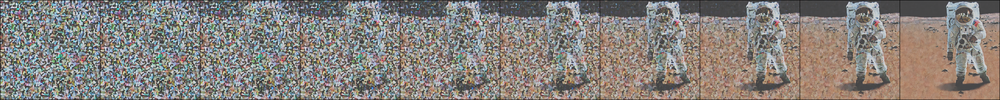

In [5]:
diffusion_process

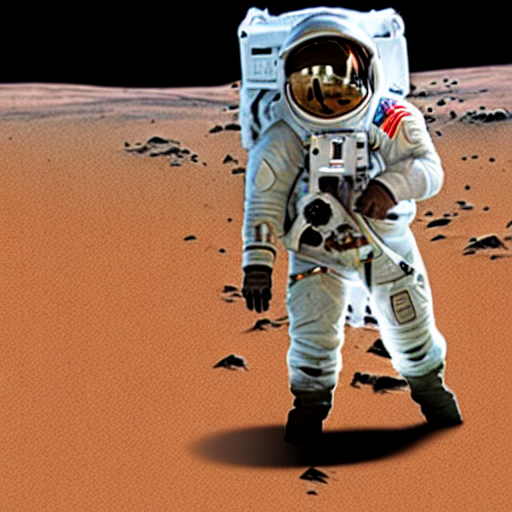

In [6]:
final_image

In [7]:
if is_torch_xla_available():
    XLA_AVAILABLE = True
else:
    XLA_AVAILABLE = False

def concat_images(images):
    image = Image.new('RGB', (512 * 4 + 24, 512), 'white')
    x_offset = 0

    for img in images:
        image.paste(img, (x_offset, 0))
        x_offset += (img.width + 8)

    return image

class SDwithNoiseArithmetic(StableDiffusionPipeline):
    @torch.no_grad()
    def __call__(
        self,
        prompt: Union[str, List[str]] = None,
        height: Optional[int] = None,
        width: Optional[int] = None,
        num_inference_steps: int = 50,
        timesteps: List[int] = None,
        sigmas: List[float] = None,
        guidance_scale: float = 7.5,
        negative_prompt: Optional[Union[str, List[str]]] = None,
        num_images_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.Tensor] = None,
        prompt_embeds: Optional[torch.Tensor] = None,
        negative_prompt_embeds: Optional[torch.Tensor] = None,
        ip_adapter_image: Optional[PipelineImageInput] = None,
        ip_adapter_image_embeds: Optional[List[torch.Tensor]] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        guidance_rescale: float = 0.0,
        clip_skip: Optional[int] = None,
        callback_on_step_end: Optional[
            Union[Callable[[int, int, Dict], None], PipelineCallback, MultiPipelineCallbacks]
        ] = None,
        callback_on_step_end_tensor_inputs: List[str] = ["latents"],
        **kwargs,
    ):
        callback = kwargs.pop("callback", None)
        callback_steps = kwargs.pop("callback_steps", None)

        if callback is not None:
            deprecate(
                "callback",
                "1.0.0",
                "Passing `callback` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`",
            )
        if callback_steps is not None:
            deprecate(
                "callback_steps",
                "1.0.0",
                "Passing `callback_steps` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`",
            )

        if isinstance(callback_on_step_end, (PipelineCallback, MultiPipelineCallbacks)):
            callback_on_step_end_tensor_inputs = callback_on_step_end.tensor_inputs

        # 0. Default height and width to unet
        if not height or not width:
            height = (
                self.unet.config.sample_size
                if self._is_unet_config_sample_size_int
                else self.unet.config.sample_size[0]
            )
            width = (
                self.unet.config.sample_size
                if self._is_unet_config_sample_size_int
                else self.unet.config.sample_size[1]
            )
            height, width = height * self.vae_scale_factor, width * self.vae_scale_factor
        # to deal with lora scaling and other possible forward hooks

        # 1. Check inputs. Raise error if not correct
        self.check_inputs(
            prompt,
            height,
            width,
            callback_steps,
            negative_prompt,
            prompt_embeds,
            negative_prompt_embeds,
            ip_adapter_image,
            ip_adapter_image_embeds,
            callback_on_step_end_tensor_inputs,
        )

        self._guidance_scale = guidance_scale
        self._guidance_rescale = guidance_rescale
        self._clip_skip = clip_skip
        self._cross_attention_kwargs = cross_attention_kwargs
        self._interrupt = False

        # 2. Define call parameters
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = self._execution_device

        # 3. Encode input prompt
        lora_scale = (
            self.cross_attention_kwargs.get("scale", None) if self.cross_attention_kwargs is not None else None
        )

        prompt_embeds, negative_prompt_embeds = self.encode_prompt(
            prompt,
            device,
            num_images_per_prompt,
            self.do_classifier_free_guidance,
            negative_prompt,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            lora_scale=lora_scale,
            clip_skip=self.clip_skip,
        )

        # For classifier free guidance, we need to do two forward passes.
        # Here we concatenate the unconditional and text embeddings into a single batch
        # to avoid doing two forward passes
        if self.do_classifier_free_guidance:
            prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])

        if ip_adapter_image is not None or ip_adapter_image_embeds is not None:
            image_embeds = self.prepare_ip_adapter_image_embeds(
                ip_adapter_image,
                ip_adapter_image_embeds,
                device,
                batch_size * num_images_per_prompt,
                self.do_classifier_free_guidance,
            )

        # 4. Prepare timesteps
        timesteps, num_inference_steps = retrieve_timesteps(
            self.scheduler, num_inference_steps, device, timesteps, sigmas
        )

        # 5. Prepare latent variables
        num_channels_latents = self.unet.config.in_channels
        latents = self.prepare_latents(
            batch_size * num_images_per_prompt,
            num_channels_latents,
            height,
            width,
            prompt_embeds.dtype,
            device,
            generator,
            latents,
        )
        latents = torch.stack([latents[0].clone() for _ in range(len(latents))], dim = 0)

        # 6. Prepare extra step kwargs. TODO: Logic should ideally just be moved out of the pipeline
        extra_step_kwargs = self.prepare_extra_step_kwargs(generator, eta)

        # 6.1 Add image embeds for IP-Adapter
        added_cond_kwargs = (
            {"image_embeds": image_embeds}
            if (ip_adapter_image is not None or ip_adapter_image_embeds is not None)
            else None
        )

        # 6.2 Optionally get Guidance Scale Embedding
        timestep_cond = None
        if self.unet.config.time_cond_proj_dim is not None:
            guidance_scale_tensor = torch.tensor(self.guidance_scale - 1).repeat(batch_size * num_images_per_prompt)
            timestep_cond = self.get_guidance_scale_embedding(
                guidance_scale_tensor, embedding_dim=self.unet.config.time_cond_proj_dim
            ).to(device=device, dtype=latents.dtype)

        # 7. Denoising loop
        num_warmup_steps = len(timesteps) - num_inference_steps * self.scheduler.order
        self._num_timesteps = len(timesteps)
        with self.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                if self.interrupt:
                    continue

                # expand the latents if we are doing classifier free guidance
                latent_model_input = torch.cat([latents] * 2) if self.do_classifier_free_guidance else latents
                if hasattr(self.scheduler, "scale_model_input"):
                    latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)

                # predict the noise residual
                noise_pred = self.unet(
                    latent_model_input,
                    t,
                    encoder_hidden_states=prompt_embeds,
                    timestep_cond=timestep_cond,
                    cross_attention_kwargs=self.cross_attention_kwargs,
                    added_cond_kwargs=added_cond_kwargs,
                    return_dict=False,
                )[0]

                # perform guidance
                if self.do_classifier_free_guidance:
                    noise_pred = self.noise_arithmetic(noise_pred)


                # compute the previous noisy sample x_t -> x_t-1
                latents = self.scheduler.step(noise_pred, t, latents, **extra_step_kwargs, return_dict=False)[0]

                if callback_on_step_end is not None:
                    callback_kwargs = {}
                    for k in callback_on_step_end_tensor_inputs:
                        callback_kwargs[k] = locals()[k]
                    callback_outputs = callback_on_step_end(self, i, t, callback_kwargs)

                    latents = callback_outputs.pop("latents", latents)
                    prompt_embeds = callback_outputs.pop("prompt_embeds", prompt_embeds)
                    negative_prompt_embeds = callback_outputs.pop("negative_prompt_embeds", negative_prompt_embeds)

                # call the callback, if provided
                if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % self.scheduler.order == 0):
                    progress_bar.update()
                    if callback is not None and i % callback_steps == 0:
                        step_idx = i // getattr(self.scheduler, "order", 1)
                        callback(step_idx, t, latents)

                # if XLA_AVAILABLE:
                #     xm.mark_step()

        if not output_type == "latent":
            image = self.vae.decode(latents / self.vae.config.scaling_factor, return_dict=False, generator=generator)[
                0
            ]
            image, has_nsfw_concept = self.run_safety_checker(image, device, prompt_embeds.dtype)
        else:
            image = latents
            has_nsfw_concept = None

        if has_nsfw_concept is None:
            do_denormalize = [True] * image.shape[0]
        else:
            do_denormalize = [not has_nsfw for has_nsfw in has_nsfw_concept]
        image = self.image_processor.postprocess(image, output_type=output_type, do_denormalize=do_denormalize)

        # Offload all models
        self.maybe_free_model_hooks()

        if not return_dict:
            return (image, has_nsfw_concept)

        return StableDiffusionPipelineOutput(images=image, nsfw_content_detected=has_nsfw_concept)


    def noise_arithmetic(self, latents):
        latents_uncond, latents_text = latents.chunk(2)
        cond = latents_text - latents_uncond
        latents = latents_uncond + self.guidance_scale * cond
        latents = arithmetic_func(latents, self.guidance_scale, cond)

        return latents

In [8]:
def arithmetic_func(latents, scale, condition):
    latents[3] = latents[3] + scale * (condition[1] - condition[0])
    return latents

def inference_with_arithmetic():
    pipe = SDwithNoiseArithmetic.from_pretrained("stable-diffusion-v1-5/stable-diffusion-v1-5", safety_checker = None)
    pipe = pipe.to("cuda")
    prompt = [
        "A photo of a Welsh Corgi",
        "A photo of a Welsh Corgi in the jungle",
        "A photo of a British Shorthair",
        "A photo of a British Shorthair"
    ]

    images = pipe(prompt, guidance_scale = 12).images
    image = concat_images(images)

    return image

image = inference_with_arithmetic()

Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  3.95it/s]
You have disabled the safety checker for <class '__main__.SDwithNoiseArithmetic'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
100%|██████████| 50/50 [1:21:57<00:00, 98.34s/it]


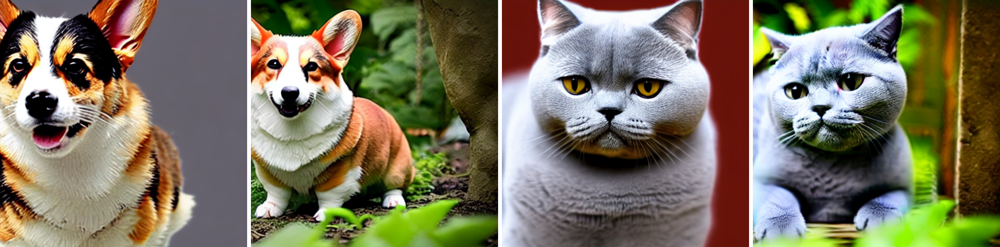

In [9]:
image